In [ ]:
import warnings

warnings.filterwarnings("ignore")

import matplotlib.pyplot as plt

!pip install geomstats
import geomstats.backend as gs

gs.random.seed(2021)
from skimage.filters import threshold_otsu
import numpy as np
from scipy import ndimage
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from skimage import color
from skimage.filters import threshold_otsu, sobel, gaussian
matplotlib.rcParams['figure.figsize'] = (20, 15)
from google.colab import drive
drive.mount('/content/drive')
import pandas as pd
%pip install opencv-contrib-python

from PIL import Image
import cv2 as cv
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


INFO: Using numpy backend
INFO: NumExpr defaulting to 2 threads.


Mounted at /content/drive
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# Melanoma Detection using Geometric Machine Learning and Shape Analysis

Ryan Guajardo and Swetha Pillai



## Background and Pipeline
<div>
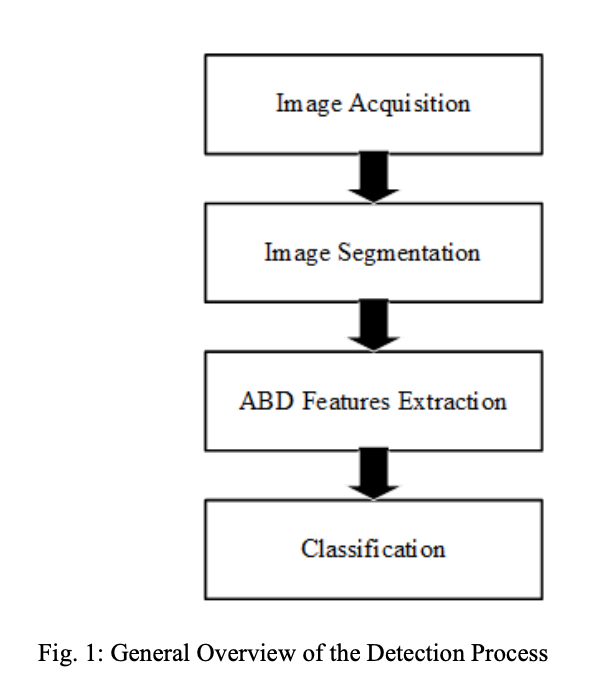
</div>

R. Moussa, F. Gerges, C. Salem, R. Akiki, O. Falou and D. Azar, "Computer-aided detection of Melanoma using geometric features," 2016 3rd Middle East Conference on Biomedical Engineering (MECBME), 2016, pp. 125-128, doi: 10.1109/MECBME.2016.7745423.

##### ABD Feature Extraction:
1. Asymmetry Index: IA is intersection area, LA is lesion area. $$AI = IA/LA$$ 
2. Border Irregularity: circularity Index, adjusted Irregularity Index$$CRC = 4xAx\frac{\pi}{Pr^2}, \quad AIrA= \frac{A}{Pr}$$
3. Diameter of the Lesion

# Our Geometric ML Pipeline
1. Image Acquisition
2. Image Contour Extraction
3. Classification with Riemannian Minimum Distance To Mean Classifier


# Data

https://www.isic-archive.com/#!/topWithHeader/onlyHeaderTop/gallery?filter=%5B%22mel_type%7Cnodular%20melanoma%22%2C%22mel_type%7Csuperficial%20spreading%20melanoma%22%5D

- ISIC dataset of 70,000 images, with metadata for each
- used a subset of 1,000 from each class

<center> <img src="original.png" width='400'/> </center>
<center> <img src="edgeshair.png" width='400'/> </center>
<center> <img src="edgesholes.png" width='400'/> </center>

# Load Images

In [ ]:
import os

path = '/content/drive/MyDrive/ECE594N'

list_paths = []
for root, directories, files in os.walk(path, topdown=False):
	for name in files:
		img_path = os.path.join(root, name)
		if img_path[-4:] == ".JPG":
			list_paths.append(img_path)
	 
list_paths = list_paths[0:150] + list_paths[1000:1150]

In [ ]:
print(list_paths)
print(len(list_paths))

['/content/drive/MyDrive/ECE594N/gross_skin/ISIC_4761058.JPG', '/content/drive/MyDrive/ECE594N/gross_skin/ISIC_8171432.JPG', '/content/drive/MyDrive/ECE594N/gross_skin/ISIC_3000292.JPG', '/content/drive/MyDrive/ECE594N/gross_skin/ISIC_9622866.JPG', '/content/drive/MyDrive/ECE594N/gross_skin/ISIC_9913448.JPG', '/content/drive/MyDrive/ECE594N/gross_skin/ISIC_0218248.JPG', '/content/drive/MyDrive/ECE594N/gross_skin/ISIC_6355353.JPG', '/content/drive/MyDrive/ECE594N/gross_skin/ISIC_2102830.JPG', '/content/drive/MyDrive/ECE594N/gross_skin/ISIC_9260532.JPG', '/content/drive/MyDrive/ECE594N/gross_skin/ISIC_3028754.JPG', '/content/drive/MyDrive/ECE594N/gross_skin/ISIC_9317483.JPG', '/content/drive/MyDrive/ECE594N/gross_skin/ISIC_6404049.JPG', '/content/drive/MyDrive/ECE594N/gross_skin/ISIC_5365617.JPG', '/content/drive/MyDrive/ECE594N/gross_skin/ISIC_5247508.JPG', '/content/drive/MyDrive/ECE594N/gross_skin/ISIC_6899527.JPG', '/content/drive/MyDrive/ECE594N/gross_skin/ISIC_9870885.JPG', '/conte

# Getting Good Contours

In [ ]:
def getContour(filepath):
  '''
  Gets the contour of each lesion for every image.
  '''

  im = cv.imread(filepath) # read image
  imgray = cv.cvtColor(im, cv.COLOR_BGR2GRAY) # convert to grayscale
  imgray = ndimage.maximum_filter(imgray, size=12) # apply max filter

  # contour detection
  ret, thresh = cv.threshold(imgray, 0, 255, cv.THRESH_BINARY_INV | cv.THRESH_OTSU) 
  contours, hierarchy = cv.findContours(thresh, cv.RETR_TREE, cv.CHAIN_APPROX_NONE) # find contour that fits the lesion

  sorted_contours = sorted(contours, key=cv.contourArea, reverse= True) # sort all contours
  largest_item = sorted_contours[0] # get the largest contour

  # cv.drawContours(imgray, largest_item, -1, (255,255,255),thickness=5)
  # plt.imshow(imgray,cmap=plt.cm.gray)

  largest_item = np.squeeze(largest_item, axis=1) # remove dimension

  return largest_item

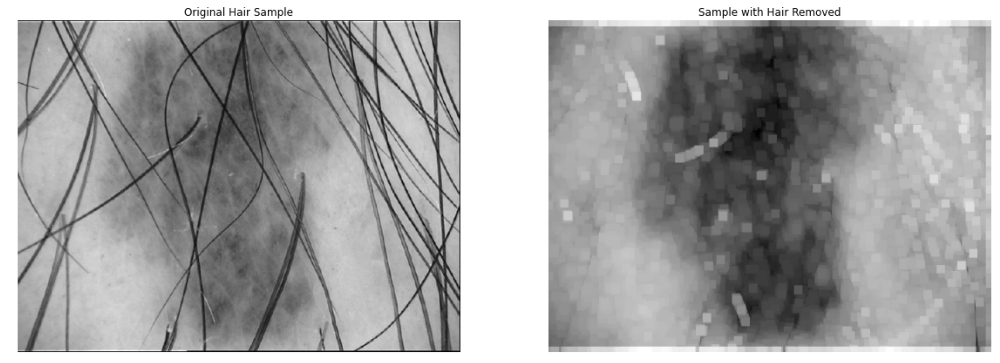

<center> <img src="gray.png" width='700'/> </center>
<center> <img src="contour.png" width='700'/> </center>

# Construct DataFrames

In [ ]:
def make_good(skin):
  '''
  Performs label encoding to convert the categorical label to numerical.
  '''

  skin['benign_malignant'] = skin['benign_malignant'].replace(['benign'],0)
  skin['benign_malignant'] = skin['benign_malignant'].replace(['malignant'],1)

  skin = skin.astype({'benign_malignant':int}) #, 'sex':int, 'anatom_site_general':int,'age_approx':int,})
  return skin

In [ ]:
good_contours = ["ISIC_0327406","ISIC_0362853","ISIC_0615970","ISIC_0626118","ISIC_0946787",
                "ISIC_1375476","ISIC_1662872","ISIC_1901298","ISIC_2146087","ISIC_2182856",
                "ISIC_2724529","ISIC_3009877","ISIC_3028754","ISIC_3068885","ISIC_3158860",
                "ISIC_3286186","ISIC_3446357","ISIC_3509891","ISIC_3775417","ISIC_4012047",
                "ISIC_4619903","ISIC_4925442","ISIC_5044438","ISIC_5247508","ISIC_5501609",
                "ISIC_5760582","ISIC_6089798","ISIC_6269166","ISIC_6355353","ISIC_6388940",
                "ISIC_6404049","ISIC_6904082","ISIC_7216877","ISIC_7233368","ISIC_7440448",
                "ISIC_7660797","ISIC_7844825","ISIC_8027899","ISIC_8036377","ISIC_8040024",
                "ISIC_8066110","ISIC_8157009","ISIC_8431668","ISIC_8493108","ISIC_8855901",
                "ISIC_8922893","ISIC_9116587","ISIC_9168624","ISIC_9399967","ISIC_9870885", 
                "ISIC_0369831","ISIC_0463621","ISIC_0495675","ISIC_0572205","ISIC_0793501",
                "ISIC_1159891","ISIC_1251639","ISIC_1350991","ISIC_1369967","ISIC_1460932",
                "ISIC_1464284","ISIC_1474461","ISIC_1633379","ISIC_1706912","ISIC_1745458",
                "ISIC_1952749","ISIC_2005921","ISIC_2079466","ISIC_2095143","ISIC_2141237",
                "ISIC_2212473","ISIC_2393348","ISIC_2406492","ISIC_2408815","ISIC_2437188",
                "ISIC_2545299","ISIC_2755667","ISIC_2776488","ISIC_2957732","ISIC_3072382",
                "ISIC_3159924","ISIC_3241636","ISIC_3254499","ISIC_3317877","ISIC_3341710",
                "ISIC_3395743","ISIC_3440759","ISIC_3673080","ISIC_3696488","ISIC_3824206",
                "ISIC_3894224","ISIC_3898738","ISIC_3909039","ISIC_3999125","ISIC_4108630",
                "ISIC_4201327","ISIC_4228799","ISIC_4276255","ISIC_4362713","ISIC_4517738",
                "ISIC_4523238","ISIC_4596089","ISIC_4653167","ISIC_4732985","ISIC_4839421",
                "ISIC_4960802","ISIC_5021861","ISIC_5045600","ISIC_5051449","ISIC_5147292",
                "ISIC_5167209","ISIC_5191344","ISIC_5434661","ISIC_5576354","ISIC_5714411",
                "ISIC_5729266","ISIC_5829938","ISIC_5869480","ISIC_5983500","ISIC_6000300",
                "ISIC_6017985","ISIC_6124481","ISIC_6535558","ISIC_6714082","ISIC_6785680",
                "ISIC_6829008","ISIC_6986010","ISIC_7098141","ISIC_7117369","ISIC_7190243",
                "ISIC_7218890","ISIC_7287303","ISIC_7295035","ISIC_7349772","ISIC_7466678",
                "ISIC_7588132","ISIC_7897925","ISIC_7951378","ISIC_7960869","ISIC_8068693",
                "ISIC_8252406","ISIC_8390671","ISIC_8545949","ISIC_8617277","ISIC_8724944",
                "ISIC_8790885","ISIC_8802922","ISIC_8892236","ISIC_8918981","ISIC_8947924",
                "ISIC_8970543","ISIC_8997983","ISIC_9000234","ISIC_9051287","ISIC_9286292",
                "ISIC_9295135","ISIC_9583969","ISIC_9596531","ISIC_9637306","ISIC_9754098",
                "ISIC_9756117","ISIC_9868388","ISIC_9927067","ISIC_9975260"]

In [ ]:
all_contours = []
img_names = []
count = 0
for path in list_paths:
  img_name = path[path.rfind('/')+1:-4]
  if img_name not in good_contours:
    continue
  print(path)
  print(count)
  contour = getContour(path)
  all_contours.append(contour)
  img_names.append(img_name)
  count += 1

data = {'img_name': img_names, 'contour_points': all_contours}
df = pd.DataFrame(data)

In [ ]:
df

,img_name,contour_points
0,ISIC_6355353,"[[291, 134], [290, 135], [289, 135], [288, 135..."
1,ISIC_3028754,"[[859, 154], [859, 155], [859, 156], [859, 157..."
2,ISIC_6404049,"[[388, 45], [387, 46], [386, 46], [385, 47], [..."
3,ISIC_5247508,"[[227, 121], [226, 122], [225, 122], [224, 123..."
4,ISIC_9870885,"[[979, 285], [978, 286], [977, 287], [976, 287..."
...,...,...
159,ISIC_8947924,"[[249, 78], [249, 79], [248, 80], [247, 80], [..."
160,ISIC_1251639,"[[349, 157], [348, 158], [347, 158], [346, 158..."
161,ISIC_8802922,"[[292, 101], [292, 102], [291, 103], [290, 103..."
162,ISIC_2437188,"[[741, 210], [741, 211], [741, 212], [741, 213..."


In [ ]:
good_skin = pd.read_csv('/content/drive/MyDrive/ECE594N/good_skin.csv', usecols = ['isic_id', 'benign_malignant'])
gross_skin = pd.read_csv('/content/drive/MyDrive/ECE594N/gross_skin.csv', usecols = ['isic_id', 'benign_malignant'])

skin = pd.concat([gross_skin, good_skin], ignore_index = True)

skin = make_good(skin)
skin.rename(columns={"isic_id":"img_name"}, inplace=True)
skin

,img_name,benign_malignant
0,ISIC_3000292,1
1,ISIC_9913448,1
2,ISIC_2560600,1
3,ISIC_8171432,1
4,ISIC_6894371,1
...,...,...
1995,ISIC_2620159,0
1996,ISIC_3499886,0
1997,ISIC_6272993,0
1998,ISIC_3116507,0


# Combine DataFrames

In [ ]:
skin = skin.join(df.set_index('img_name'), on='img_name', how='right', sort=True)

In [ ]:
skin

,img_name,benign_malignant,contour_points
54,ISIC_0327406,1,"[[953, 143], [952, 144], [951, 144], [950, 144..."
1045,ISIC_0362853,0,"[[316, 67], [316, 68], [315, 69], [314, 70], [..."
46,ISIC_0369831,1,"[[912, 0], [912, 1], [912, 2], [912, 3], [912,..."
1058,ISIC_0463621,0,"[[1004, 323], [1003, 324], [1002, 324], [1001,..."
1138,ISIC_0495675,0,"[[298, 54], [298, 55], [298, 56], [298, 57], [..."
...,...,...,...
1076,ISIC_9756117,0,"[[740, 172], [739, 173], [738, 174], [737, 175..."
1147,ISIC_9868388,0,"[[741, 237], [741, 238], [741, 239], [740, 240..."
15,ISIC_9870885,1,"[[979, 285], [978, 286], [977, 287], [976, 287..."
1123,ISIC_9927067,0,"[[952, 0], [952, 1], [952, 2], [952, 3], [952,..."


In [ ]:
coords = []
for point in skin.contour_points:
  print(point.shape)
  coords.append(point.shape[0])

# Interpolate

In [ ]:
def interpolate(curve, nb_points):
    """Interpolate a discrete curve with nb_points from a discrete curve.

    Returns
    -------
    interpolation : discrete curve with nb_points points
    """
    old_length = curve.shape[0]
    interpolation = gs.zeros((nb_points, 2))
    incr = old_length / nb_points
    pos = 0
    for i in range(nb_points):
        index = int(gs.floor(pos))
        interpolation[i] = curve[index] + (pos - index) * (
            curve[(index + 1) % old_length] - curve[index]
        )
        pos += incr
    return interpolation


N_SAMPLING_POINTS = 5000

(-23.200000000000003, 487.2, 33.15, 491.85)

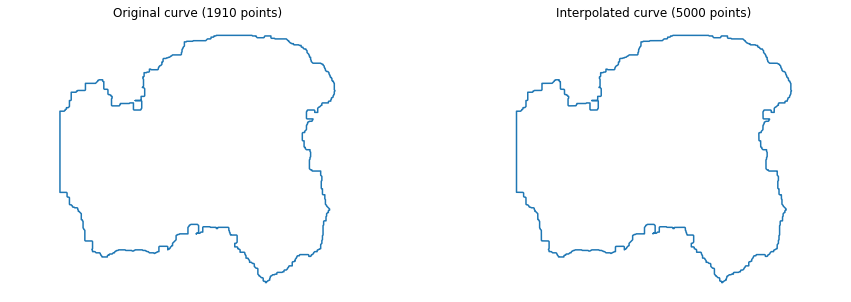

In [ ]:
cell_rand = all_contours[gs.random.randint(len(all_contours))]
cell_interpolation = interpolate(cell_rand, N_SAMPLING_POINTS)

fig = plt.figure(figsize=(15, 5))

fig.add_subplot(121)
plt.plot(cell_rand[:, 0], cell_rand[:, 1])
plt.axis("equal")
plt.title(f"Original curve ({len(cell_rand)} points)")
plt.axis("off")

fig.add_subplot(122)
plt.plot(cell_interpolation[:, 0], cell_interpolation[:, 1])
plt.axis("equal")
plt.title(f"Interpolated curve ({N_SAMPLING_POINTS} points)")
plt.axis("off")

# Preprocessing

In [ ]:
import numpy as np

def preprocess(curve, tol=1e-10):
    """Preprocess curve to ensure that there are no consecutive duplicate points.

    Returns
    -------
    curve : discrete curve
    """

    dist = curve[1:] - curve[:-1]
    dist_norm = np.sqrt(np.sum(np.square(dist), axis=1))

    if np.any( dist_norm < tol ):
        for i in range(len(curve)-1):
            if np.sqrt(np.sum(np.square(curve[i+1] - curve[i]), axis=0)) < tol:
                curve[i+1] = (curve[i] + curve[i+2]) / 2

    return curve

# Alignment

In [ ]:
from geomstats.geometry.pre_shape import PreShapeSpace

M_AMBIENT = 2

PRESHAPE_SPACE = PreShapeSpace(m_ambient=M_AMBIENT, k_landmarks=N_SAMPLING_POINTS)
PRESHAPE_METRIC = PRESHAPE_SPACE.embedding_metric


def exhaustive_align(curve, base_curve):
    """Align curve to base_curve to minimize the L² distance.

    Returns
    -------
    aligned_curve : discrete curve
    """
    nb_sampling = len(curve)
    distances = gs.zeros(nb_sampling)
    for shift in range(nb_sampling):
        reparametrized = [curve[(i + shift) % nb_sampling] for i in range(nb_sampling)]
        aligned = PRESHAPE_SPACE.align(point=reparametrized, base_point=base_curve)
        distances[shift] = PRESHAPE_METRIC.norm(
            gs.array(aligned) - gs.array(base_curve)
        )
    shift_min = gs.argmin(distances)
    reparametrized_min = [
        curve[(i + shift_min) % nb_sampling] for i in range(nb_sampling)
    ]
    aligned_curve = PRESHAPE_SPACE.align(
        point=reparametrized_min, base_point=base_curve
    )
    return aligned_curve

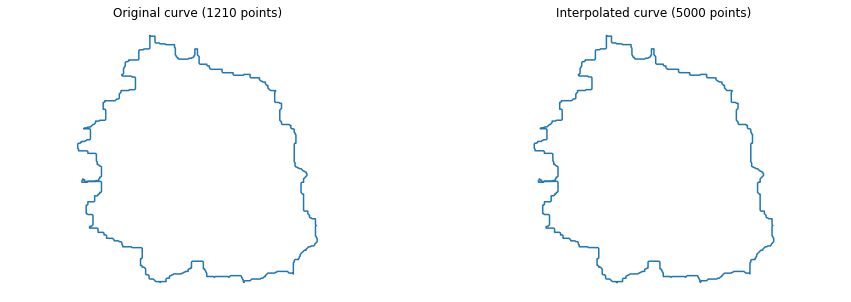

In [ ]:
cell_rand = all_contours[gs.random.randint(len(all_contours))]
cell_interpolation1 = interpolate(cell_rand, N_SAMPLING_POINTS)

fig = plt.figure(figsize=(15, 5))

fig.add_subplot(121)
plt.plot(cell_rand[:, 0], cell_rand[:, 1])
plt.axis("equal")
plt.title(f"Original curve ({len(cell_rand)} points)")
plt.axis("off")

fig.add_subplot(122)
plt.plot(cell_interpolation1[:, 0], cell_interpolation1[:, 1])
plt.axis("equal")
plt.title(f"Interpolated curve ({N_SAMPLING_POINTS} points)")
plt.axis("off")

plt.savefig("interpolation.svg")

In [ ]:
cell_interpolation = interpolate(cell_rand, N_SAMPLING_POINTS)

proc = preprocess(cell_interpolation)

proj = PRESHAPE_SPACE.projection(proc)

BASE_CURVE = cell_interpolation1
align = exhaustive_align(proj, BASE_CURVE)

# Plotting Cells

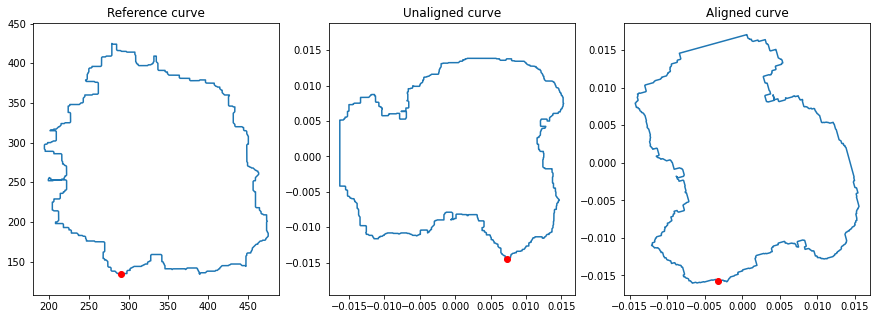

In [ ]:
unaligned_cell = proj
aligned_cell = align

fig = plt.figure(figsize=(15, 5))

fig.add_subplot(131)
plt.plot(BASE_CURVE[:, 0], BASE_CURVE[:, 1])
plt.plot(BASE_CURVE[0, 0], BASE_CURVE[0, 1], "ro")
plt.axis("equal")
plt.title("Reference curve")

fig.add_subplot(132)
plt.plot(unaligned_cell[:, 0], unaligned_cell[:, 1])
plt.plot(unaligned_cell[0, 0], unaligned_cell[0, 1], "ro")
plt.axis("equal")
plt.title("Unaligned curve")

fig.add_subplot(133)
plt.plot(aligned_cell[:, 0], aligned_cell[:, 1])
plt.plot(aligned_cell[0, 0], aligned_cell[0, 1], "ro")
plt.axis("equal")
plt.title("Aligned curve")

plt.savefig("alignment.svg")

In [ ]:
count = 0
interpolated = []
for contour in skin.contour_points:
  cell_interpolation = interpolate(contour, N_SAMPLING_POINTS)
  interpolated.append(cell_interpolation)
  print(count)
  count += 1
  
print("---")
count = 0
processed = []
projected = []
aligned = []
BASE_CURVE = interpolated[0]
for i in interpolated:
  proc = preprocess(i)
  processed.append(proc)
  proj = PRESHAPE_SPACE.projection(proc)
  projected.append(proj)
  align = exhaustive_align(proj, BASE_CURVE)
  aligned.append(align)
  print(count)
  count += 1

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
---
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139


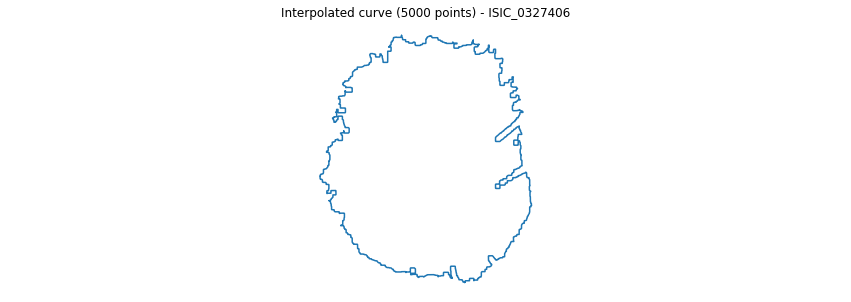

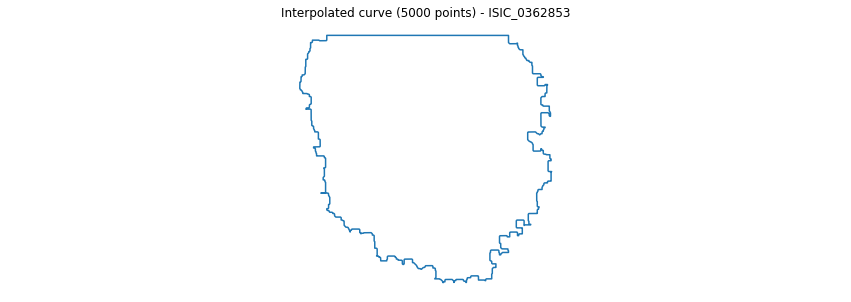

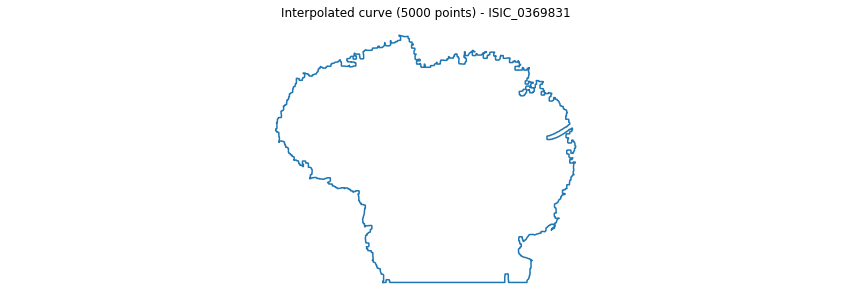

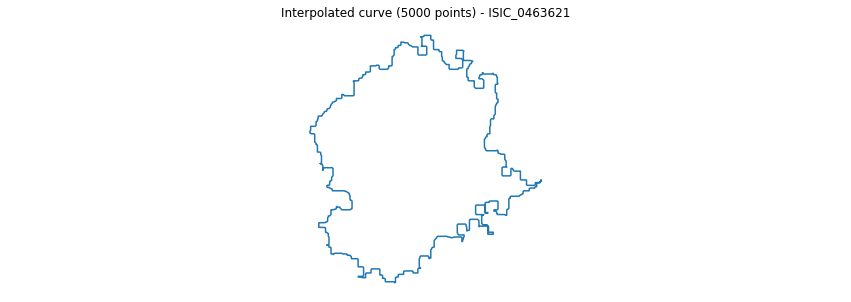

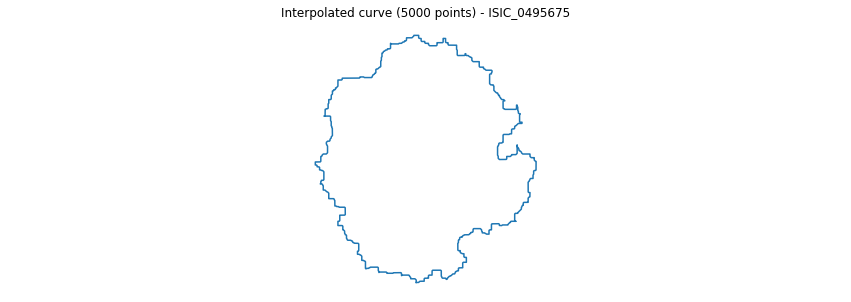

...

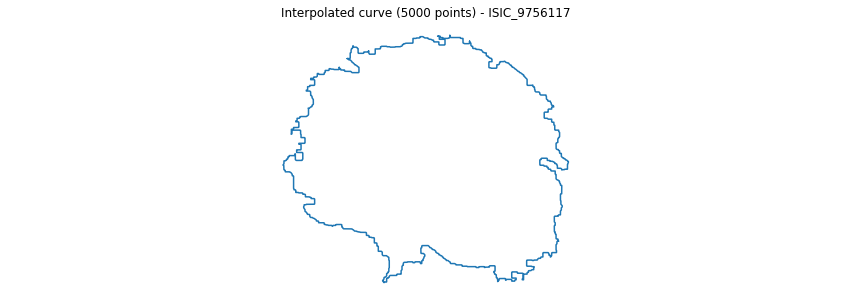

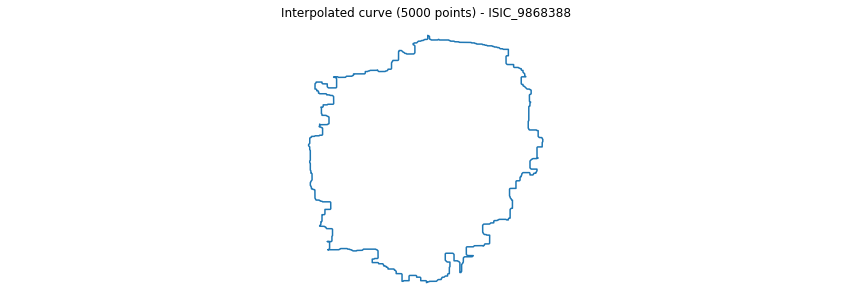

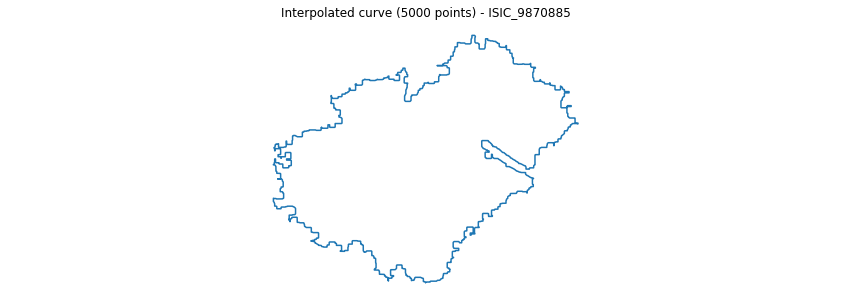

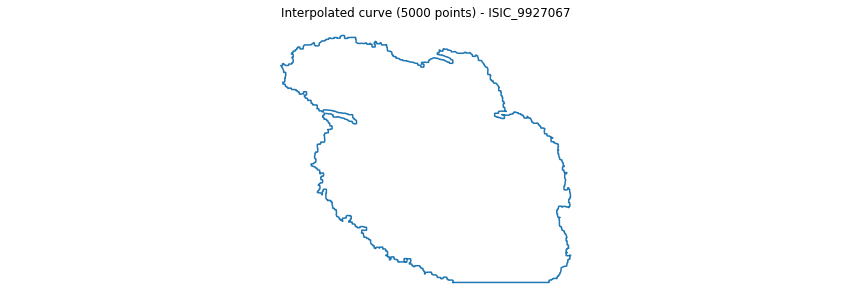

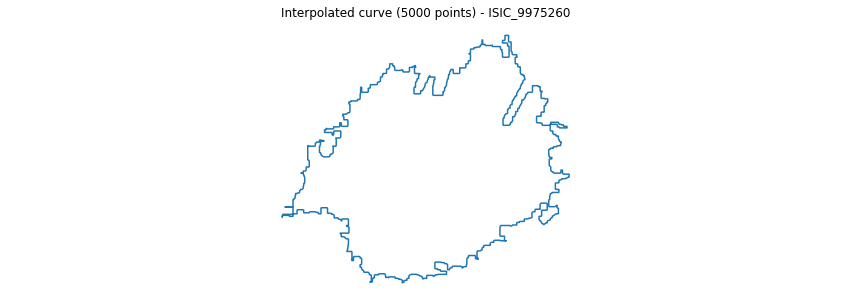

In [ ]:
for i in range(len(skin.contour_points)):
  fig = plt.figure(figsize=(15, 5))

  plt.plot(interpolated[i][:, 0], interpolated[i][:, 1])
  plt.axis("equal")
  plt.title(f"Interpolated curve ({N_SAMPLING_POINTS} points) - {skin['img_name'].iloc[i]}")
  plt.axis("off")
  # Show/save figure as desired.
  # plt.savefig('/content/drive/MyDrive/ECE594N/contours/' + str(skin['img_name'].iloc[i]))
plt.show()

KeyboardInterrupt: ignored

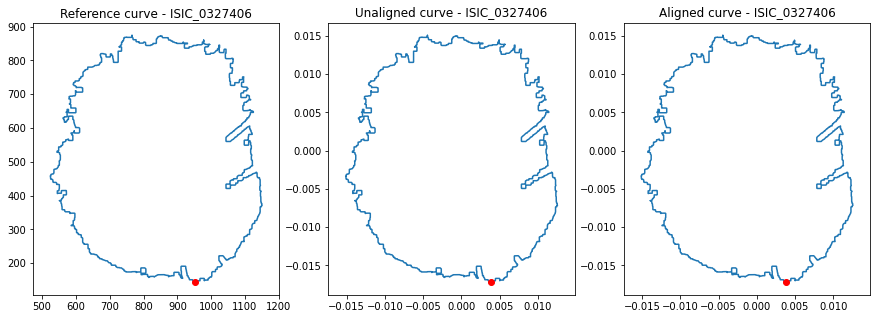

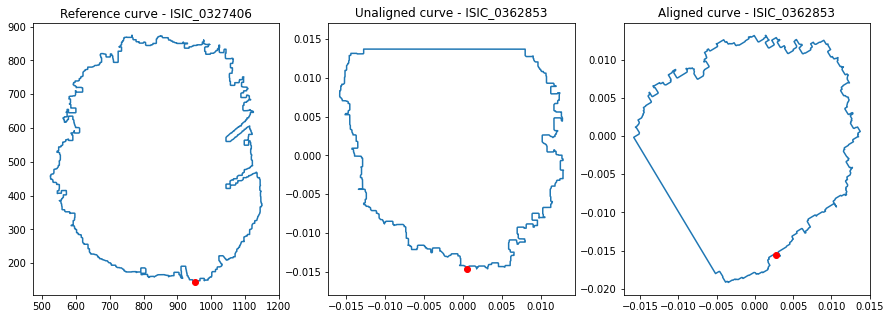

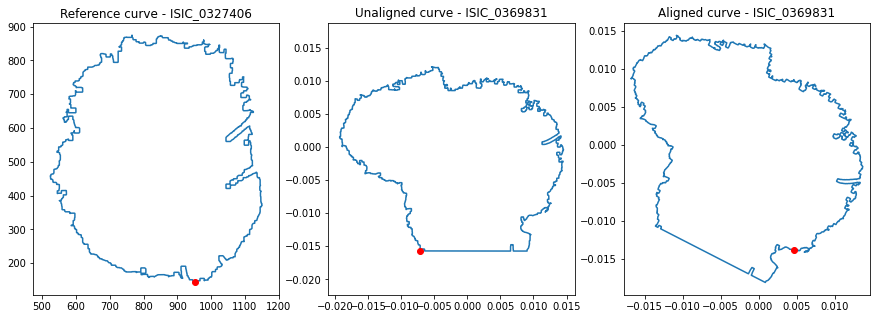

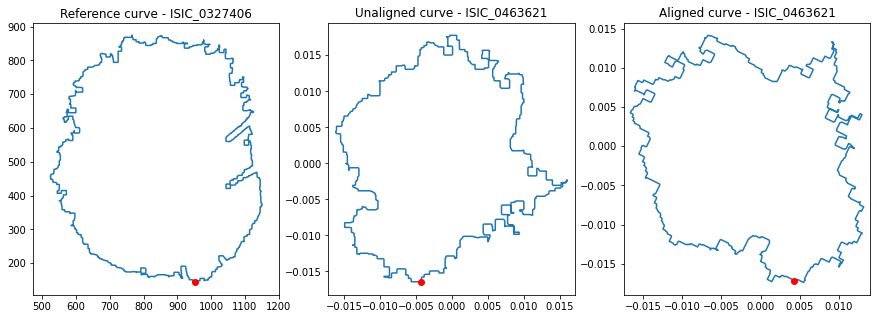

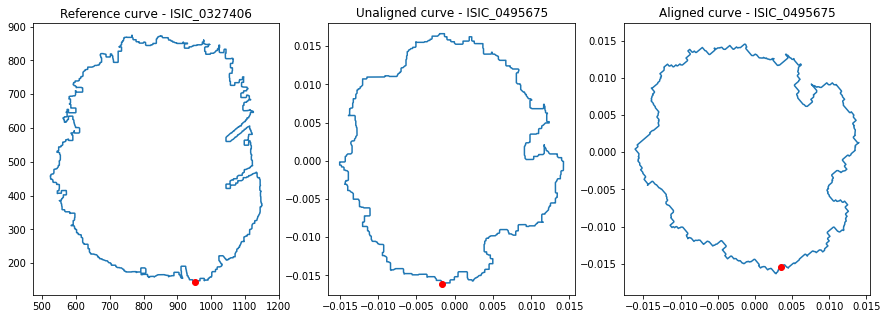

...

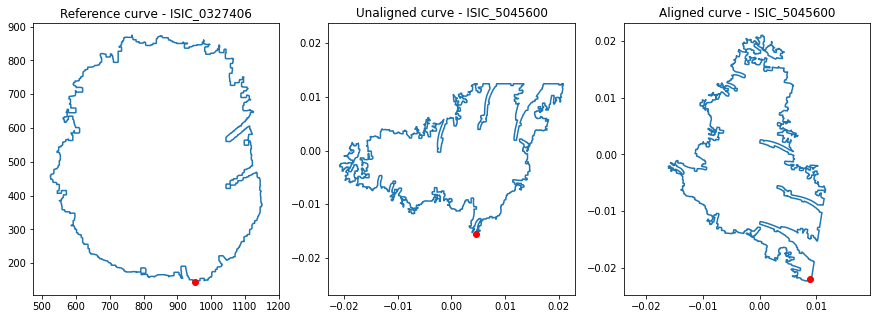

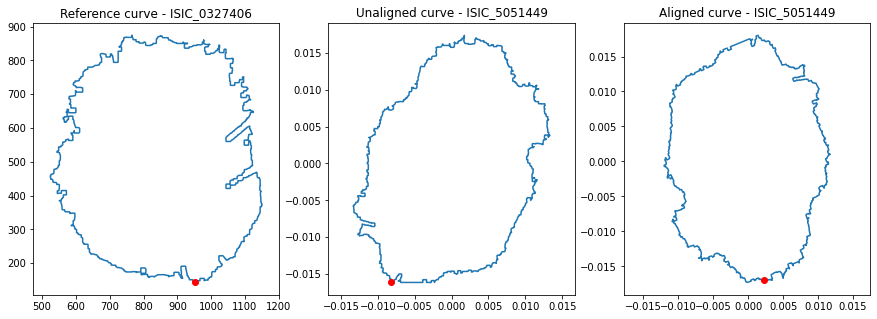

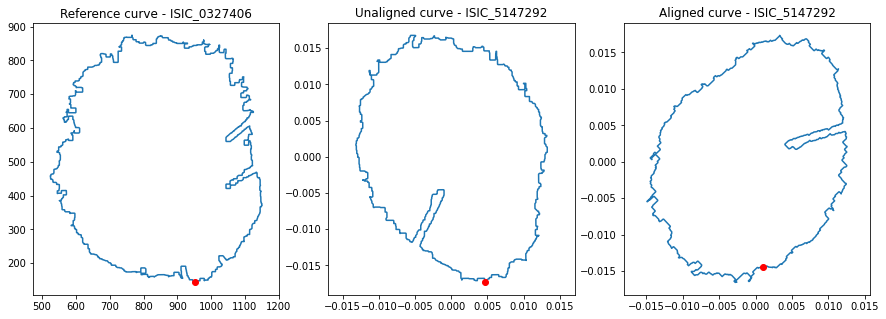

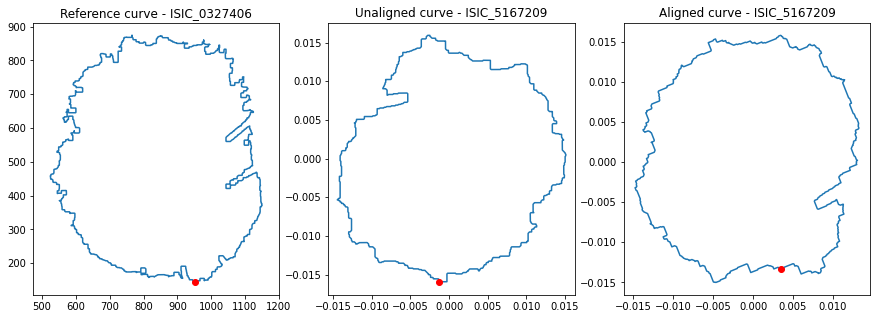

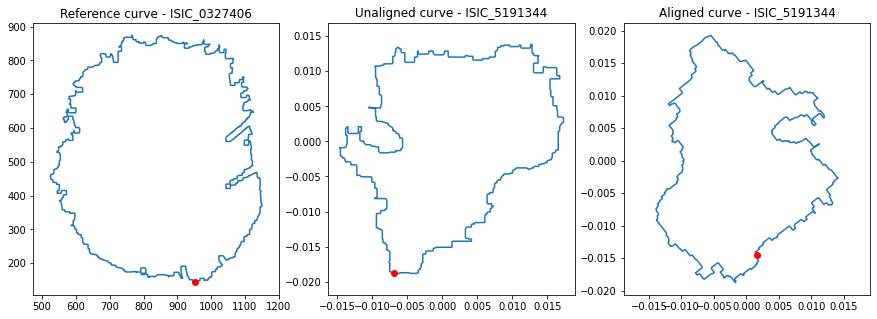

In [ ]:
for i in range(len(skin.contour_points)):
  unaligned_cell = projected[i]
  aligned_cell = aligned[i]

  fig = plt.figure(figsize=(15, 5))

  fig.add_subplot(131)
  plt.plot(BASE_CURVE[:, 0], BASE_CURVE[:, 1])
  plt.plot(BASE_CURVE[0, 0], BASE_CURVE[0, 1], "ro")
  plt.axis("equal")
  plt.title("Reference curve - " + str(skin['img_name'].iloc[0]))

  fig.add_subplot(132)
  plt.plot(unaligned_cell[:, 0], unaligned_cell[:, 1])
  plt.plot(unaligned_cell[0, 0], unaligned_cell[0, 1], "ro")
  plt.axis("equal")
  plt.title("Unaligned curve - " + str(skin['img_name'].iloc[i]))

  fig.add_subplot(133)
  plt.plot(aligned_cell[:, 0], aligned_cell[:, 1])
  plt.plot(aligned_cell[0, 0], aligned_cell[0, 1], "ro")
  plt.axis("equal")
  plt.title("Aligned curve - " + str(skin['img_name'].iloc[i]))
  # Show/save figure as desired.
  plt.savefig('/content/drive/MyDrive/ECE594N/alignments/' + str(skin['img_name'].iloc[i]))

# Classification

Tangent Machine Learning:
1. Frechet mean + log + traditional ML model
2. ToTangentSpace() + traditional ML model
3. RiemannianMinimumDistanceToMeanClassifier() 

All 3 methods use Frechet mean but it doesn't work for us.

<center> <img src="frechet_open.png" width='700'/> </center>
<center> <img src="frechet_closed.png" width='700'/> </center>

# Naive Method

Training:
1. Divide cells in the train set by class
2. Compute the mean shape of each class - np.mean()

Testing:
1. Find the distance to the mean shape of each class for each cell in the test set - metric.dist()
2. Assign the label of the class with the minimum distance

Only difference is that we use the linear mean instead of the Frechet mean.

In [ ]:
data = skin.copy()
data

,img_name,benign_malignant,contour_points
54,ISIC_0327406,1,"[[953, 143], [952, 144], [951, 144], [950, 144..."
1045,ISIC_0362853,0,"[[316, 67], [316, 68], [315, 69], [314, 70], [..."
46,ISIC_0369831,1,"[[912, 0], [912, 1], [912, 2], [912, 3], [912,..."
1058,ISIC_0463621,0,"[[1004, 323], [1003, 324], [1002, 324], [1001,..."
1138,ISIC_0495675,0,"[[298, 54], [298, 55], [298, 56], [298, 57], [..."
...,...,...,...
1076,ISIC_9756117,0,"[[740, 172], [739, 173], [738, 174], [737, 175..."
1147,ISIC_9868388,0,"[[741, 237], [741, 238], [741, 239], [740, 240..."
15,ISIC_9870885,1,"[[979, 285], [978, 286], [977, 287], [976, 287..."
1123,ISIC_9927067,0,"[[952, 0], [952, 1], [952, 2], [952, 3], [952,..."


In [ ]:
data.drop(columns=['contour_points'], inplace=True)
data['aligned'] = aligned

In [ ]:
data

,img_name,benign_malignant,aligned
54,ISIC_0327406,1,"[[0.003825729495606133, -0.017218618349892953]..."
1045,ISIC_0362853,0,"[[0.0027411113471661397, -0.01558863065400592]..."
46,ISIC_0369831,1,"[[0.004658076576458807, -0.013830709463734003]..."
1058,ISIC_0463621,0,"[[0.004252770055293269, -0.017174356410537852]..."
1138,ISIC_0495675,0,"[[0.003578284071608388, -0.01544410651390871],..."
...,...,...,...
1076,ISIC_9756117,0,"[[0.0019724326659777574, -0.014532282259664056..."
1147,ISIC_9868388,0,"[[0.0033615047403284014, -0.015318533496878114..."
15,ISIC_9870885,1,"[[0.0007827055004675579, -0.012986908706042268..."
1123,ISIC_9927067,0,"[[0.0028100759196154003, -0.016832937098558487..."


In [ ]:
data.to_pickle('/content/drive/MyDrive/ECE594N/data.csv')

In [ ]:
temp = pd.read_pickle('/content/drive/MyDrive/ECE594N/data.csv')
temp

,img_name,benign_malignant,aligned
54,ISIC_0327406,1,"[[0.003825729495606133, -0.017218618349892953]..."
1045,ISIC_0362853,0,"[[0.0027411113471661397, -0.01558863065400592]..."
46,ISIC_0369831,1,"[[0.004658076576458807, -0.013830709463734003]..."
1058,ISIC_0463621,0,"[[0.004252770055293269, -0.017174356410537852]..."
1138,ISIC_0495675,0,"[[0.003578284071608388, -0.01544410651390871],..."
...,...,...,...
1076,ISIC_9756117,0,"[[0.0019724326659777574, -0.014532282259664056..."
1147,ISIC_9868388,0,"[[0.0033615047403284014, -0.015318533496878114..."
15,ISIC_9870885,1,"[[0.0007827055004675579, -0.012986908706042268..."
1123,ISIC_9927067,0,"[[0.0028100759196154003, -0.016832937098558487..."


# Split into train/test sets

In [ ]:
X = data.drop(columns=['img_name', 'benign_malignant']).copy()
y = data.benign_malignant.copy()

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)

print(f"The dataset has {len(X)} cells.")
print(f"The train set has {len(X_train)} cells.")
print(f"The test set has {len(X_test)} cells.")

The dataset has 164 cells.
The train set has 109 cells.
The test set has 55 cells.


In [ ]:
X_train['benign_malignant'] = y_train.copy()

# 1. Group by class

In [ ]:
grouped = X_train.groupby(by=['benign_malignant'])

In [ ]:
grouped_df = []

for name, group in grouped:
  print(name)
  print(group)
  grouped_df.append(group)

0
                                                aligned  benign_malignant
1072  [[0.002792825672319728, -0.017996459089703782]...                 0
1082  [[0.004042100597660285, -0.017587381697099645]...                 0
1054  [[0.004074043147067558, -0.015562407856220995]...                 0
1032  [[0.006497719302982277, -0.014153685595487846]...                 0
1146  [[0.0027863878581402515, -0.01676152246477488]...                 0
1086  [[0.0022745847258500394, -0.016999507780996934...                 0
1066  [[0.0025190099557328245, -0.01464686321609543]...                 0
1078  [[0.005039232662594161, -0.014124763702913498]...                 0
1070  [[0.002062042536224735, -0.015582910703006813]...                 0
1111  [[0.003313375392108941, -0.013032699119400016]...                 0
1094  [[0.003354424699842188, -0.015309612295559261]...                 0
1115  [[0.001649612049192373, -0.014832353201470853]...                 0
1039  [[0.004878262652299092, -0.014

In [ ]:
def formatData(data):
  '''
  Format the data so that we can easily use it.
  '''
    
  values = data.aligned.values.tolist()
  values = np.array(values)
  values = gs.array(values)
  return values

In [ ]:
group0 = formatData(grouped_df[0])
group1 = formatData(grouped_df[1])

# 2. Compute mean shape of each class

In [ ]:
def findMeanLesionShape(data):
  '''
  Find the linear mean.
  '''

  mean_estimate = np.mean(data, axis=0)
  mean_estimate = mean_estimate[~gs.isnan(gs.sum(mean_estimate, axis=1)), :]
  return mean_estimate

In [ ]:
mean0 = findMeanLesionShape(group0)
mean1 = findMeanLesionShape(group1)

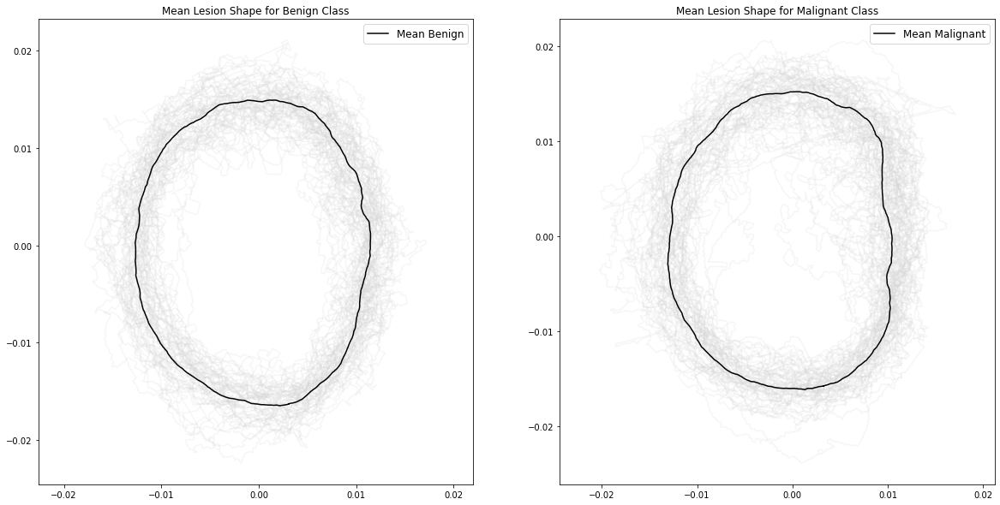

In [ ]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(20,10))

for cell in group0:
    ax1.plot(cell[:, 0], cell[:, 1], "lightgrey", alpha=0.2)
ax1.plot(mean0[:, 0], mean0[:, 1], "black", label="Mean Benign")
ax1.set_xticks([-.02,-0.01,0,0.01,0.02])
ax1.set_title('Mean Lesion Shape for Benign Class')
ax1.legend(fontsize=12);
ax1.axis('equal')


for cell in group1:
    ax2.plot(cell[:, 0], cell[:, 1], "lightgrey", alpha=0.2)
ax2.plot(mean1[:, 0], mean1[:, 1], "black", label="Mean Malignant")
ax2.set_title('Mean Lesion Shape for Malignant Class')
ax2.legend(fontsize=12);
ax2.axis('equal')
plt.show()

## Plot the Gaussian distribution for each class

In [ ]:
from scipy.stats import gaussian_kde

def getDistribution(data, mean):
  '''
  Use Gaussian kernel density estimation to plot the distribution of all the shapes. 
  '''

  cells_to_plot = data[gs.random.randint(len(data), size=20)]
  points_to_plot = cells_to_plot.reshape(-1, 2)

  z = gaussian_kde(points_to_plot.T)(points_to_plot.T)
  z_norm = z / z.max()

  return points_to_plot, z_norm

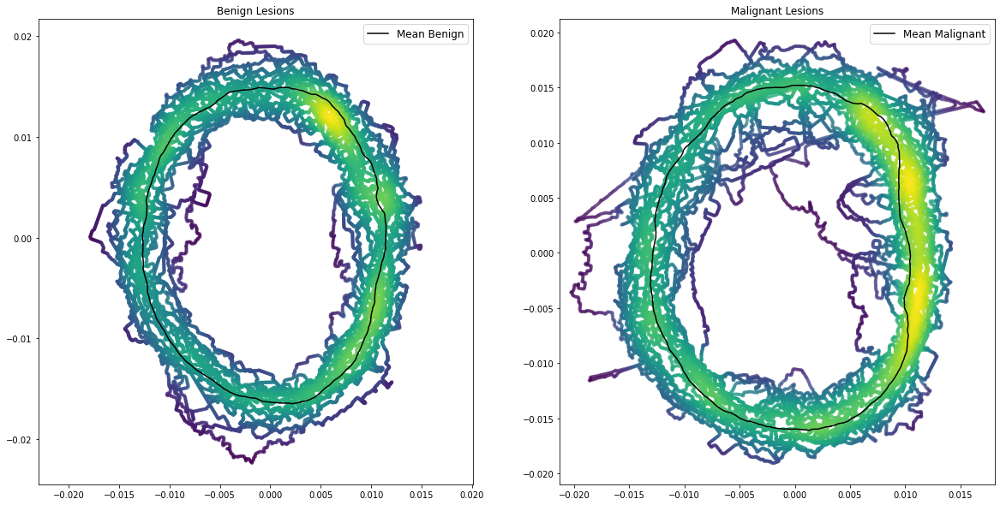

In [ ]:
points_to_plot0, z_norm0 = getDistribution(group0, mean0)
points_to_plot1, z_norm1 = getDistribution(group1, mean1)

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(20,10))

ax1.scatter(points_to_plot0[:, 0], points_to_plot0[:, 1], alpha=0.2, c=z_norm0, s=10)
ax1.plot(mean0[:, 0], mean0[:, 1], "black", label="Mean Benign")
ax1.set_title('Benign Lesions')
ax1.axis('equal')
ax1.legend(fontsize=12)

ax2.scatter(points_to_plot1[:, 0], points_to_plot1[:, 1], alpha=0.2, c=z_norm1, s=10)
ax2.plot(mean1[:, 0], mean1[:, 1], "black", label="Mean Malignant")
ax2.set_title('Malignant Lesions')
ax2.axis('equal')
ax2.legend(fontsize=12)

plt.show()

# 3. Find distance to mean shape and assign label

In [ ]:
from geomstats.geometry.discrete_curves import R2, DiscreteCurves, SRVMetric

def predict(data, mean_estimate_clean0, mean_estimate_clean1):
  '''
  Predict the label of the shape by finding the distance to each class and choosing the minimum.
  '''

  CURVES_SPACE = DiscreteCurves(R2)
  SRV_METRIC = CURVES_SPACE.square_root_velocity_metric

  # find distances for each cell to each mean shape
  dists_to_group0_mean = []
  dists_to_group1_mean = []
  for cell in data:
    dist = SRV_METRIC.dist(cell, mean_estimate_clean0)
    dists_to_group0_mean.append(dist)
    dist = SRV_METRIC.dist(cell, mean_estimate_clean1)
    dists_to_group1_mean.append(dist)
 
  # assign the label as that with the minimum distance
  predictions = []
  for i in range(len(dists_to_group0_mean)):
    if dists_to_group0_mean[i] >  dists_to_group1_mean[i]:
      predictions.append(1) 
    else:
      predictions.append(0) 
  
  predictions = np.array(predictions)
  return predictions

# Evaluating the model

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix
import seaborn as sns

def acc(y_test, y_pred):
  '''
  Get the accuracy and plot the confusion matrix.
  '''

  y_test = np.array(y_test)
  accuracy = accuracy_score(y_test, y_pred)
  print(f"Accuracy: {accuracy * 100}%")

  cm = confusion_matrix(y_test, y_pred)
  heatmap = sns.heatmap(cm, annot=True, cmap='pink')

  heatmap.set_title('Confusion Matrix')
  heatmap.set_xlabel('Predicted Values')
  heatmap.set_ylabel('Actual Values ')
  heatmap.xaxis.set_ticklabels(['Benign', 'Malignant'])
  heatmap.yaxis.set_ticklabels(['Benign', 'Malignant'])

  plt.show()

Accuracy: 92.66055045871559%


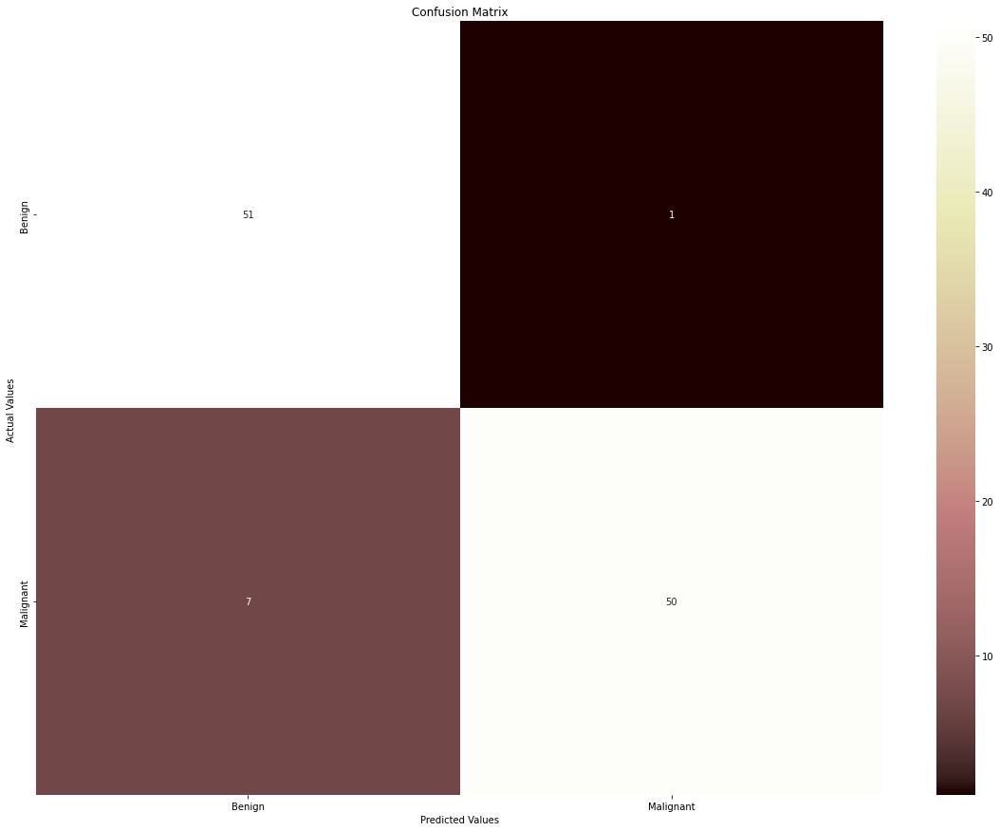

In [ ]:
# X_train = formatData(X_train)
train_pred = predict(X_train, mean0, mean1)
acc(y_train,train_pred)

Accuracy: 49.09090909090909%


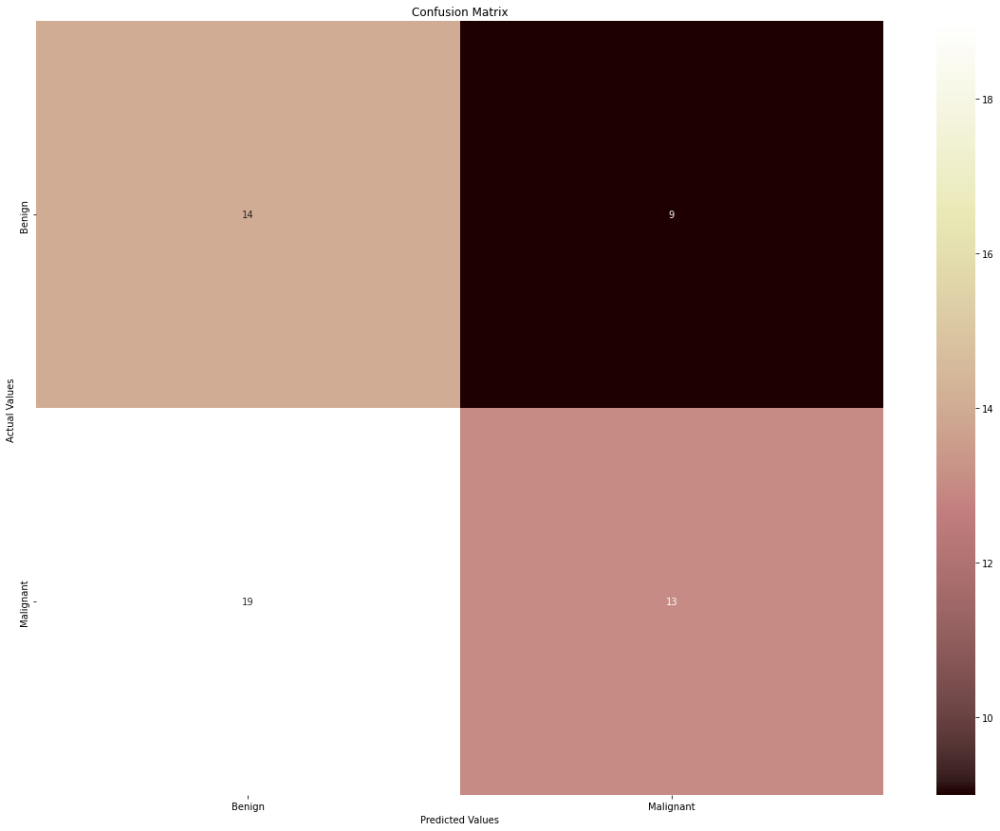

In [ ]:
# X_test = formatData(X_test)
test_pred = predict(X_test, mean0, mean1)
acc(y_test,test_pred)

# Results

- 93% accuracy on training data :]
- 49% accuracy on test data :'[

# Issues/Improvements

- severe overfitting
- super naive, crude model
- maybe more data?
- preprocess data to remove hair better

# References

https://github.com/bioshape-lab/ece594n/blob/main/lectures/03_b_classification.ipynb
https://github.com/geomstats/geomstats/blob/master/notebooks/11_real_world_applications__cell_shapes_analysis.ipynb

https://www.isic-archive.com/#!/topWithHeader/onlyHeaderTop/gallery?filter=%5B%22mel_type%7Cnodular%20melanoma%22%2C%22mel_type%7Csuperficial%20spreading%20melanoma%22%5D

R. Moussa, F. Gerges, C. Salem, R. Akiki, O. Falou and D. Azar, "Computer-aided detection of Melanoma using geometric features," 2016 3rd Middle East Conference on Biomedical Engineering (MECBME), 2016, pp. 125-128, doi: 10.1109/MECBME.2016.7745423.